## Limpieza de datos

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

##### Para mostrar todas las columnas y las filas:

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

##### Definición del directorio de trabajo y acceso a datos:

In [37]:
import os
os.chdir(r"C:\Users\lrude\Documents\GitHub\PROYECTO_EDA_PYTHON")
os.getcwd()

'C:\\Users\\lrude\\Documents\\GitHub\\PROYECTO_EDA_PYTHON'

##### Carga del conjunto de datos desde un archivo CSV:

In [38]:
df_bank_ad = pd.read_csv("data/bank-additional.csv", index_col=0)
df_bank_ad.head(50)

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,date,latitude,longitude,id_
0,NaN,housemaid,MARRIED,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2-agosto-2019,41.495,-71.233,089b39d8-e4d0-461b-87d4-814d71e0e079
1,57.0,services,MARRIED,high.school,NaN,0.0,0.0,telephone,149,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,14-septiembre-2016,34.601,-83.923,e9d37224-cb6f-4942-98d7-46672963d097
2,37.0,services,MARRIED,high.school,0.0,1.0,0.0,telephone,226,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,15-febrero-2019,34.939,-94.847,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,40.0,admin.,MARRIED,basic.6y,0.0,0.0,0.0,telephone,151,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-noviembre-2015,49.041,-70.308,9991fafb-4447-451a-8be2-b0df6098d13e
4,56.0,services,MARRIED,high.school,0.0,0.0,1.0,telephone,307,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,29-enero-2017,38.033,-104.463,eca60b76-70b6-4077-80ba-bc52e8ebb0eb
5,45.0,services,MARRIED,basic.9y,NaN,0.0,0.0,telephone,198,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,26-septiembre-2015,24.689,-101.643,d63ede72-0b6d-45b1-8872-385ac6897f65
6,59.0,admin.,MARRIED,professional.course,0.0,0.0,0.0,telephone,139,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,25-enero-2019,31.456,-94.561,5e3483e5-236d-437d-8351-541f9d09b9dd
7,NaN,blue-collar,MARRIED,NaN,NaN,0.0,0.0,telephone,217,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,25-septiembre-2017,46.871,-122.235,87fdc08b-30ae-4dab-803f-561ecdf27ff0
8,24.0,technician,SINGLE,professional.course,0.0,1.0,0.0,telephone,380,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,18-enero-2018,44.632,-85.811,87b79988-2be5-419d-88f4-56655852c565
9,25.0,services,SINGLE,high.school,0.0,1.0,0.0,telephone,50,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,2-noviembre-2016,30.297,-117.382,ea6b7d04-9271-4c0a-a01f-07795d164aba


##### Inspección de la estructura del DataFrame

###### Tareas de limpieza:
- Columna "date" transformar en formato "date"
- Columna "id_" transformar a "id"

In [8]:
df_bank_ad.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43000 entries, 0 to 27570
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             37880 non-null  float64
 1   job             42655 non-null  object 
 2   marital         42915 non-null  object 
 3   education       41193 non-null  object 
 4   default         34019 non-null  float64
 5   housing         41974 non-null  float64
 6   loan            41974 non-null  float64
 7   contact         43000 non-null  object 
 8   duration        43000 non-null  int64  
 9   campaign        43000 non-null  int64  
 10  pdays           43000 non-null  int64  
 11  previous        43000 non-null  int64  
 12  poutcome        43000 non-null  object 
 13  emp.var.rate    43000 non-null  float64
 14  cons.price.idx  42529 non-null  object 
 15  cons.conf.idx   43000 non-null  object 
 16  euribor3m       33744 non-null  object 
 17  nr.employed     43000 non-null  obje

In [9]:
df_bank_ad.describe().T

,count,mean,std,min,25%,50%,75%,max
age,37880.0,39.977112,10.437957,17.000,32.00000,38.0000,47.00000,98.000
default,34019.0,0.000088,0.009390,0.000,0.00000,0.0000,0.00000,1.000
housing,41974.0,0.535998,0.498708,0.000,0.00000,1.0000,1.00000,1.000
loan,41974.0,0.155620,0.362499,0.000,0.00000,0.0000,0.00000,1.000
duration,43000.0,257.739279,258.666033,0.000,102.00000,179.0000,319.00000,4918.000
campaign,43000.0,2.567233,2.772294,1.000,1.00000,2.0000,3.00000,56.000
pdays,43000.0,962.330953,187.260394,0.000,999.00000,999.0000,999.00000,999.000
previous,43000.0,0.174023,0.497366,0.000,0.00000,0.0000,0.00000,7.000
emp.var.rate,43000.0,0.077128,1.573898,-3.400,-1.80000,1.1000,1.40000,1.400
latitude,43000.0,36.856697,7.225948,24.396,30.61475,36.7610,43.11325,49.384


##### Conversión de la columna 'date' al tipo de dato datetime

In [10]:
# Creamos un diccionario de reemplazo
meses_es = {
    'enero': '01', 'febrero': '02', 'marzo': '03', 'abril': '04',
    'mayo': '05', 'junio': '06', 'julio': '07', 'agosto': '08',
    'septiembre': '09', 'octubre': '10', 'noviembre': '11', 'diciembre': '12'}

# Cambiamos los nombres de los meses a números dentro de la cadena
for mes_nom, mes_num in meses_es.items():
    df_bank_ad['date'] = df_bank_ad['date'].str.replace(mes_nom, mes_num, case=False)

In [11]:
# Convertimos la columna 'date' al tipo 'datetime'
df_bank_ad['date'] = pd.to_datetime(df_bank_ad['date'], dayfirst=True)

In [12]:
# Comprobamos tipo de dato de la columna 'date'
df_bank_ad['date'].dtypes

dtype('<M8[ns]')

In [13]:
df_bank_ad['month'] = df_bank_ad['date'].dt.month
df_bank_ad['year'] = df_bank_ad['date'].dt.year
df_bank_ad.head()

,age,job,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,date,latitude,longitude,id_,month,year
0,NaN,housemaid,MARRIED,basic.4y,0.0,0.0,0.0,telephone,261,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2019-08-02,41.495,-71.233,089b39d8-e4d0-461b-87d4-814d71e0e079,8.0,2019.0
1,57.0,services,MARRIED,high.school,NaN,0.0,0.0,telephone,149,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,2016-09-14,34.601,-83.923,e9d37224-cb6f-4942-98d7-46672963d097,9.0,2016.0
2,37.0,services,MARRIED,high.school,0.0,1.0,0.0,telephone,226,1,999,0,NONEXISTENT,1.1,"93,994","-36,4","4,857",5191,no,2019-02-15,34.939,-94.847,3f9f49b5-e410-4948-bf6e-f9244f04918b,2.0,2019.0
3,40.0,admin.,MARRIED,basic.6y,0.0,0.0,0.0,telephone,151,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,2015-11-29,49.041,-70.308,9991fafb-4447-451a-8be2-b0df6098d13e,11.0,2015.0
4,56.0,services,MARRIED,high.school,0.0,0.0,1.0,telephone,307,1,999,0,NONEXISTENT,1.1,"93,994","-36,4",NaN,5191,no,2017-01-29,38.033,-104.463,eca60b76-70b6-4077-80ba-bc52e8ebb0eb,1.0,2017.0


In [14]:
df_bank_ad.duplicated().sum()

np.int64(0)

In [34]:
df_bank_ad.isnull().sum()

age               5120
job                345
marital             85
education         1807
default           8981
housing           1026
loan              1026
contact              0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx     471
cons.conf.idx        0
euribor3m         9256
nr.employed          0
y                    0
date               248
latitude             0
longitude            0
id_                  0
month              248
year               248
dtype: int64

In [33]:
nulos = ((df_bank_ad.isnull().sum()/df_bank_ad.shape[0]) *100)
nulos

age               11.906977
job                0.802326
marital            0.197674
education          4.202326
default           20.886047
housing            2.386047
loan               2.386047
contact            0.000000
duration           0.000000
campaign           0.000000
pdays              0.000000
previous           0.000000
poutcome           0.000000
emp.var.rate       0.000000
cons.price.idx     1.095349
cons.conf.idx      0.000000
euribor3m         21.525581
nr.employed        0.000000
y                  0.000000
date               0.576744
latitude           0.000000
longitude          0.000000
id_                0.000000
month              0.576744
year               0.576744
dtype: float64

In [35]:
df_nulos = pd.DataFrame(nulos, columns=['nulos%'])
df_nulos[df_nulos['nulos%']>0].sort_values(by='nulos%',ascending=False)

,nulos%
euribor3m,21.525581
default,20.886047
age,11.906977
education,4.202326
loan,2.386047
housing,2.386047
cons.price.idx,1.095349
job,0.802326
month,0.576744
date,0.576744


In [15]:
consumidores_2012 = pd.read_excel("data/customer-details.xlsx", sheet_name= "2012", index_col=0)
consumidores_2012

,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
0,161770,1,0,2012-04-04,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,85477,1,1,2012-12-30,7,e9d37224-cb6f-4942-98d7-46672963d097
2,147233,1,1,2012-02-02,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,121393,1,2,2012-12-21,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,63164,1,2,2012-06-20,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb
5,143854,0,1,2012-01-24,26,d63ede72-0b6d-45b1-8872-385ac6897f65
6,76439,1,0,2012-08-15,3,5e3483e5-236d-437d-8351-541f9d09b9dd
7,159686,1,1,2012-12-10,21,87fdc08b-30ae-4dab-803f-561ecdf27ff0
8,179933,0,0,2012-08-22,18,87b79988-2be5-419d-88f4-56655852c565
9,77504,1,0,2012-02-09,18,ea6b7d04-9271-4c0a-a01f-07795d164aba


In [16]:
consumidores_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20115 entries, 0 to 20114
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Income             20115 non-null  int64         
 1   Kidhome            20115 non-null  int64         
 2   Teenhome           20115 non-null  int64         
 3   Dt_Customer        20115 non-null  datetime64[ns]
 4   NumWebVisitsMonth  20115 non-null  int64         
 5   ID                 20115 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 1.1+ MB


In [17]:
consumidores_2012.isnull().sum()

Income               0
Kidhome              0
Teenhome             0
Dt_Customer          0
NumWebVisitsMonth    0
ID                   0
dtype: int64

In [18]:
consumidores_2012.describe().T

,count,mean,min,25%,50%,75%,max,std
Income,20115.0,93087.213224,5852.0,49110.0,92962.0,136705.0,180791.0,50614.798255
Kidhome,20115.0,1.004176,0.0,0.0,1.0,2.0,2.0,0.816811
Teenhome,20115.0,0.999503,0.0,0.0,1.0,2.0,2.0,0.815298
Dt_Customer,20115,2012-07-01 17:15:14.362416128,2012-01-01 00:00:00,2012-04-01 00:00:00,2012-07-02 00:00:00,2012-09-30 00:00:00,2012-12-31 00:00:00,NaN
NumWebVisitsMonth,20115.0,16.54079,1.0,9.0,16.0,25.0,32.0,9.235324


In [19]:
consumidores_2012.duplicated().sum()

np.int64(0)

In [20]:
consumidores_2012.iloc[:,[4,5]]

,NumWebVisitsMonth,ID
0,29,089b39d8-e4d0-461b-87d4-814d71e0e079
1,7,e9d37224-cb6f-4942-98d7-46672963d097
2,5,3f9f49b5-e410-4948-bf6e-f9244f04918b
3,29,9991fafb-4447-451a-8be2-b0df6098d13e
4,20,eca60b76-70b6-4077-80ba-bc52e8ebb0eb
5,26,d63ede72-0b6d-45b1-8872-385ac6897f65
6,3,5e3483e5-236d-437d-8351-541f9d09b9dd
7,21,87fdc08b-30ae-4dab-803f-561ecdf27ff0
8,18,87b79988-2be5-419d-88f4-56655852c565
9,18,ea6b7d04-9271-4c0a-a01f-07795d164aba


In [21]:
consumidores_2012.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'NumWebVisitsMonth',
       'ID'],
      dtype='object')

In [22]:
consumidores_2012.loc[:,["ID","Income"]]

,ID,Income
0,089b39d8-e4d0-461b-87d4-814d71e0e079,161770
1,e9d37224-cb6f-4942-98d7-46672963d097,85477
2,3f9f49b5-e410-4948-bf6e-f9244f04918b,147233
3,9991fafb-4447-451a-8be2-b0df6098d13e,121393
4,eca60b76-70b6-4077-80ba-bc52e8ebb0eb,63164
5,d63ede72-0b6d-45b1-8872-385ac6897f65,143854
6,5e3483e5-236d-437d-8351-541f9d09b9dd,76439
7,87fdc08b-30ae-4dab-803f-561ecdf27ff0,159686
8,87b79988-2be5-419d-88f4-56655852c565,179933
9,ea6b7d04-9271-4c0a-a01f-07795d164aba,77504


In [23]:
condicion_kid = (consumidores_2012["Kidhome"]==0)
condicion_teen = (consumidores_2012["Teenhome"].between (1,2, inclusive = "both" ))

consumidores_2012[(condicion_kid) & (condicion_teen)]

,Income,Kidhome,Teenhome,Dt_Customer,NumWebVisitsMonth,ID
5,143854,0,1,2012-01-24,26,d63ede72-0b6d-45b1-8872-385ac6897f65
11,84813,0,1,2012-06-06,30,ca5c0d7a-8bbd-42b3-8351-1074c5be011a
12,102006,0,1,2012-03-24,18,66a752e2-b2f1-440c-9a8f-cc3b10d74dd0
21,158116,0,2,2012-10-08,21,47591c83-e88b-40c2-bb8e-de40b94a44cb
26,104766,0,2,2012-12-19,32,cbf9c247-762f-40f9-a351-a7e686ac7488
27,118851,0,2,2012-02-08,30,b4861606-8206-4f41-acd5-63b48d5596a1
33,128876,0,2,2012-10-06,1,a028192c-3c95-4935-aa95-06515e5fd38d
45,52087,0,2,2012-03-09,13,01d47e8f-32e7-4fd8-8188-2761a09f42bb
51,139751,0,2,2012-06-23,15,d43355a7-b518-46f4-8713-b9daba3e586f
59,42782,0,1,2012-05-14,15,df2754f0-ab9d-4392-969f-255be30bcf95


In [24]:
consumidores_2012.groupby("Kidhome")[["ID"]].count()

,ID
Kidhome,
0,6668
1,6695
2,6752


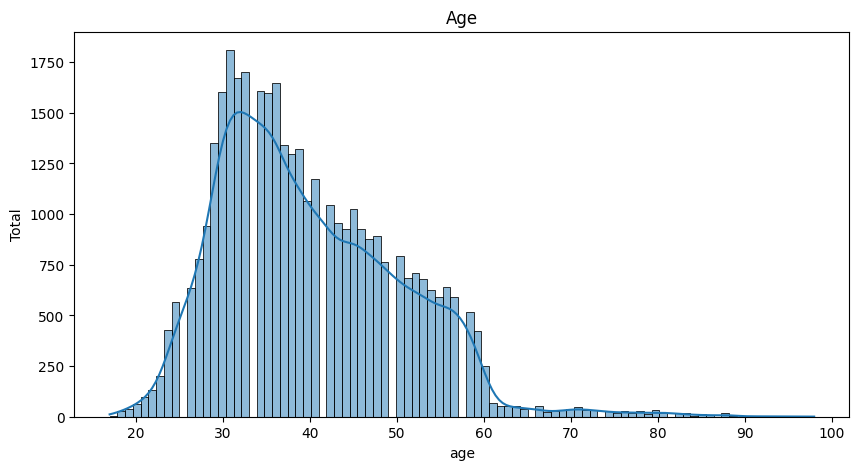

In [25]:
plt.figure(figsize=(10,5))
sns.histplot(data=df_bank_ad['age'],kde=True)
plt.title("Age")
plt.ylabel("Total")
plt.show()

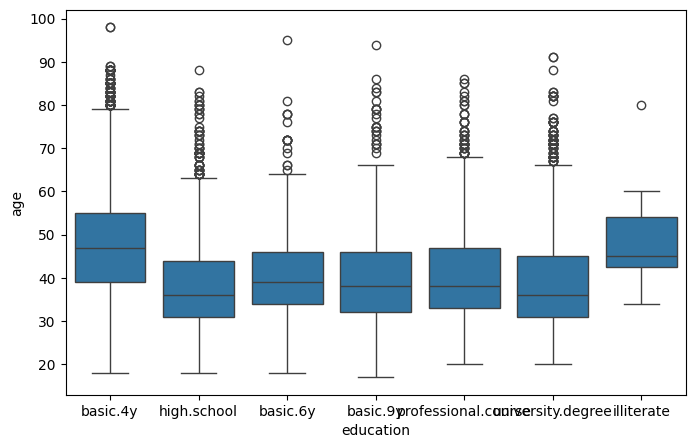

In [30]:
plt.figure(figsize=(8,5))
sns.boxplot(x='education', y='age', data=df_bank_ad.reset_index())

plt.show()

In [ ]:
print(df_bank_ad.index.is_unique)

False
